In [1]:
import os
import pickle
import jieba
import operator
import statistics
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as font_manager
from datetime import datetime
from collections import Counter

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

from news_model import *

font_path = '../msjh.ttc'
font = font_manager.FontProperties(fname='../msjh.ttc',
                                   weight='bold',
                                   style='normal', size=16)

In [2]:
with open('../crawler/data/newhead_news.pkl', 'rb') as handle:
    data = pickle.load(handle)
    
contents = []
for news in data :
    contents.append(news['content'])

In [3]:
jieba.set_dictionary('../jieba_data/dict.txt.big')
jieba.load_userdict('../jieba_data/userdict.txt')
stopwords = []
with open('../jieba_data/stopwords.txt', 'r', encoding='UTF-8') as file:
    for each in file.readlines():
        stopwords.append(each.strip())
    stopwords.append(' ')

Building prefix dict from C:\Users\GIGABYTE\fin_class\jieba_data\dict.txt.big ...
Loading model from cache C:\Users\GIGABYTE\AppData\Local\Temp\jieba.u76dcdccef8b36c29aab3e633e439e35d.cache
Loading model cost 1.498 seconds.
Prefix dict has been built succesfully.


In [4]:
# add cutted dict to each news
for i in range(len(data)):
    current_content = data[i]['content']
    current_cutted = jieba.lcut(remove_punctuation(current_content))
    data[i]['cutted_dict'] = lcut_to_dict(current_cutted)

In [5]:
get_coshow(contents[:1000])[:10]

[('68', 100),
 ('8延伸閱讀', 54),
 ('228事件', 40),
 ('今（', 37),
 ('3月', 32),
 ('他說', 31),
 ('也是', 31),
 ('為了', 29),
 ('保留徵召', 28),
 ('的人', 26)]

In [6]:
cutted_dict = get_cutted_dict(contents[:1000])
high_freq_pair = first_n_words(cutted_dict, 20)
high_freq_pair

[('台灣', 1726),
 ('韓國瑜', 1038),
 ('柯文哲', 989),
 ('國民黨', 895),
 ('中國', 760),
 ('民進黨', 727),
 ('臉書', 592),
 ('希望', 592),
 ('媒體', 569),
 ('指出', 552),
 ('國家', 523),
 ('一個', 516),
 ('總統', 503),
 ('蔡英文', 489),
 ('支持', 472),
 ('吳敦義', 440),
 ('華航', 429),
 ('提出', 419),
 ('王金平', 409),
 ('政治', 407)]

In [7]:
cutted_dict = get_cutted_dict(contents)

In [8]:
# 可能人名
possible_name = first_n_words(cutted_dict, 1000, 3, 3)
possible_name[:40]

[('民進黨', 3399),
 ('柯文哲', 2880),
 ('韓國瑜', 2847),
 ('國民黨', 2705),
 ('蔡英文', 2136),
 ('蘇貞昌', 1238),
 ('行政院', 1058),
 ('賴清德', 983),
 ('王金平', 923),
 ('吳敦義', 916),
 ('卓榮泰', 826),
 ('馬英九', 795),
 ('陳思宇', 788),
 ('朱立倫', 776),
 ('立法院', 736),
 ('候選人', 716),
 ('習近平', 693),
 ('記者會', 632),
 ('黨主席', 627),
 ('蔡總統', 600),
 ('管中閔', 588),
 ('陳其邁', 569),
 ('高雄市', 565),
 ('游盈隆', 553),
 ('黃國昌', 546),
 ('何志偉', 518),
 ('林佳龍', 508),
 ('總統府', 507),
 ('台北市', 499),
 ('委員會', 446),
 ('鄭文燦', 418),
 ('外交部', 417),
 ('新北市', 400),
 ('促轉會', 387),
 ('教育部', 378),
 ('鄭麗君', 376),
 ('交通部', 356),
 ('陳水扁', 351),
 ('12月', 347),
 ('基金會', 340)]

In [9]:
for i in possible_name[:5] :
    print(i[0])

民進黨
柯文哲
韓國瑜
國民黨
蔡英文


In [10]:
# 可能事件
possible_events = first_n_words(cutted_dict, 200, 4)
possible_events[:40]

[('九二共識', 896),
 ('立委補選', 834),
 ('總統蔡英文', 709),
 ('2020', 649),
 ('高雄市長韓國瑜', 599),
 ('台北市長柯文哲', 540),
 ('中華民國', 464),
 ('一國兩制', 456),
 ('時代力量', 441),
 ('兩岸關係', 372),
 ('轉型正義', 364),
 ('蔡英文總統', 355),
 ('台灣人民', 333),
 ('兩岸一家親', 280),
 ('行政院長蘇貞昌', 278),
 ('政治人物', 275),
 ('行政院長', 274),
 ('民進黨立委', 263),
 ('非洲豬瘟', 260),
 ('九合一選舉', 245),
 ('行政院長賴清德', 245),
 ('高雄市政府', 239),
 ('2018年', 238),
 ('中正紀念堂', 233),
 ('台大校長', 228),
 ('2020總統', 227),
 ('前總統馬英九', 225),
 ('總統初選', 225),
 ('2019年', 220),
 ('參選總統', 220),
 ('民進黨主席', 213),
 ('2020總統大選', 208),
 ('就職典禮', 198),
 ('2020年', 194),
 ('總統大選', 188),
 ('兩岸和平', 187),
 ('國民黨主席吳敦義', 184),
 ('2016年', 182),
 ('雙城論壇', 182),
 ('新北市長朱立倫', 180)]

In [11]:
for i in possible_events[:5] :
    print(i[0])

九二共識
立委補選
總統蔡英文
2020
高雄市長韓國瑜


In [12]:
names = []
with open('../data/names.txt', 'r', encoding='utf-8-sig') as f:
    names = f.read().split('\n')
    
events = []
with open('../data/events.txt', 'r', encoding='utf-8-sig') as f:
    events = f.read().split('\n')

In [13]:
print(' '.join(names[:5]))
print(' '.join(events[:5]))

民進黨 柯文哲 韓國瑜 國民黨 蔡英文
九二共識 立委補選 總統蔡英文 2020 高雄市長韓國瑜


25431


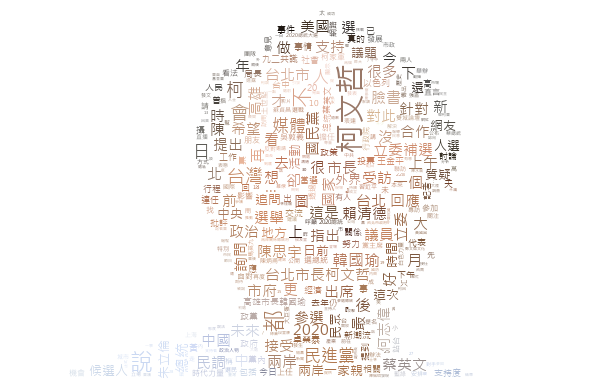

In [14]:
# 柯文哲
kp_wc = get_wordcloud_of_keywords('柯文哲', contents, image_path='../politicians/kp.png')
# kp_wc.to_file('politicians/kpwc.png')
kp_wc.to_image()

In [15]:
news_containing_kp = news_containing_keyword('柯文哲', contents)
kp_dict = get_cutted_dict(news_containing_kp)
first_n_words(kp_dict, 5)

[('柯文哲', 2880), ('台灣', 1058), ('媒體', 928), ('民進黨', 877), ('韓國瑜', 771)]

### 在此要注意 date_index 必定要是小到大否則最後在計算num_of_terms會出問題

In [23]:
date_list = [news['date'] for news in data]
all_date = sorted(list(set(date_list)))
aall_date = [date[5:] for date in all_date][::-1]
date_index = sorted([date_list.index(each_date) for each_date in all_date])
date_index.append(len(date_list)-1)
number_of_news = [date_index[i+1] - date_index[i]-1 for i in range(len(date_index)-1)]
number_of_terms = [sum([sum(data[ni]['cutted_dict'].values()) for ni in range(date_index[i], date_index[i+1])]) for i in range(len(date_index)-1)]

In [27]:
date_index

[0,
 21,
 55,
 77,
 114,
 174,
 230,
 292,
 317,
 353,
 409,
 456,
 535,
 597,
 652,
 695,
 727,
 794,
 844,
 895,
 934,
 982,
 995,
 1006,
 1015,
 1022,
 1039,
 1063,
 1067,
 1074,
 1093,
 1133,
 1178,
 1220,
 1260,
 1309,
 1352,
 1375,
 1422,
 1472,
 1531,
 1599,
 1647,
 1676,
 1711,
 1763,
 1826,
 1877,
 1940,
 2003,
 2047,
 2067,
 2132,
 2201,
 2259,
 2318,
 2376,
 2413,
 2437,
 2504,
 2584,
 2653,
 2678,
 2700,
 2720,
 2739,
 2794,
 2853,
 2926,
 3026,
 3092,
 3124,
 3165,
 3217,
 3283,
 3351,
 3423,
 3474,
 3506,
 3530,
 3583,
 3648,
 3718,
 3761]

In [28]:
# 每日詞數
wn_by_day = {}
for i in range(len(date_index)-1):
#     print(date_index[i+1])
    oneday_news = data[date_index[i]: date_index[i+1]]
    oneday_dict = [news['cutted_dict'] for news in oneday_news]
    current_word_dict = merge_one_day_news_dict(oneday_dict)
#     print(all_date[i])
    wn_by_day[all_date[i]] = current_word_dict

In [29]:
wn_by_day

{'2018-12-11': {'瓜田李下': 1.0,
  '役男': 1.0,
  '／': 8.0,
  '條款': 1.0,
  '騙': 1.0,
  '感覺': 1.0,
  '組長': 1.0,
  '發現': 6.0,
  '培育': 1.0,
  '免得': 1.0,
  '選舉': 6.0,
  '善意': 2.0,
  '站台': 3.0,
  '前行政院長': 4.0,
  '被騙': 1.0,
  '台灣主權': 1.0,
  '另一邊': 1.0,
  '博覽會': 1.0,
  '機器': 1.0,
  '以北': 1.0,
  '一部': 1.0,
  '皆': 3.0,
  '麗珍': 1.0,
  '分開': 2.0,
  '展昭': 1.0,
  '訪': 3.0,
  '定位': 1.0,
  '不容': 1.0,
  '全國': 4.0,
  '受審': 1.0,
  '大方向': 1.0,
  '李玉文': 1.0,
  '二林': 1.0,
  '面臨': 1.0,
  '局長': 3.0,
  '簽署': 2.0,
  '開誠': 2.0,
  '就要': 4.0,
  '幾天': 2.0,
  '竄升': 1.0,
  '事蹟': 1.0,
  '曾': 7.0,
  '很大': 1.0,
  '鐵定': 1.0,
  '下': 5.0,
  '駐': 2.0,
  '很紅': 1.0,
  '到處': 1.0,
  '到底': 7.0,
  '威權': 2.0,
  '大': 6.0,
  '感謝': 2.0,
  '詭異': 1.0,
  '寫': 1.0,
  '瘋傳': 1.0,
  '決心': 2.0,
  '國內': 1.0,
  '年齡': 1.0,
  '大選': 1.0,
  '前總統': 1.0,
  '高污染': 1.0,
  '影': 3.0,
  '子': 1.0,
  '奇怪': 1.0,
  '新書': 5.0,
  '整肅': 1.0,
  '訴訟': 1.0,
  '列車': 1.0,
  '惹怒': 1.0,
  '許智傑': 1.0,
  '不分': 1.0,
  '下一代': 2.0,
  '再也': 1.0,
  '媽媽': 1.0,
  '難以': 1.0,
  '靈活多樣

In [30]:
# 每日詞頻
tf_by_day = {}
for i in range(len(date_index)-1):
    oneday_news = data[date_index[i]: date_index[i+1]]
    oneday_dict = [news['cutted_dict'] for news in oneday_news]
    current_word_dict = merge_one_day_news_dict(oneday_dict, divide=number_of_terms[i])
#     print(all_date[i])
    tf_by_day[all_date[i]] = current_word_dict

In [31]:
tf_by_day

{'2018-12-11': {'瓜田李下': 0.000189000189000189,
  '役男': 0.000189000189000189,
  '／': 0.001512001512001512,
  '條款': 0.000189000189000189,
  '騙': 0.000189000189000189,
  '感覺': 0.000189000189000189,
  '組長': 0.000189000189000189,
  '發現': 0.001134001134001134,
  '培育': 0.000189000189000189,
  '免得': 0.000189000189000189,
  '選舉': 0.001134001134001134,
  '善意': 0.000378000378000378,
  '站台': 0.000567000567000567,
  '前行政院長': 0.000756000756000756,
  '被騙': 0.000189000189000189,
  '台灣主權': 0.000189000189000189,
  '另一邊': 0.000189000189000189,
  '博覽會': 0.000189000189000189,
  '機器': 0.000189000189000189,
  '以北': 0.000189000189000189,
  '一部': 0.000189000189000189,
  '皆': 0.000567000567000567,
  '麗珍': 0.000189000189000189,
  '分開': 0.000378000378000378,
  '展昭': 0.000189000189000189,
  '訪': 0.000567000567000567,
  '定位': 0.000189000189000189,
  '不容': 0.000189000189000189,
  '全國': 0.000756000756000756,
  '受審': 0.000189000189000189,
  '大方向': 0.000189000189000189,
  '李玉文': 0.000189000189000189,
  '二林': 0.000189000

In [32]:
# 每天出現的字
occur_by_day = {}
for i in range(len(date_index)-1):
    oneday_news = data[date_index[i]: date_index[i+1]]
    oneday_dict = [news['cutted_dict'] for news in oneday_news]
    current_word_dict = merge_one_day_news_dict(oneday_dict, count='occur', divide=number_of_news[i])
#     print(all_date[i])
    occur_by_day[all_date[i]] = current_word_dict

In [33]:
occur_by_day

{'2018-12-11': {'瓜田李下': 0.05,
  '役男': 0.05,
  '／': 0.3,
  '條款': 0.05,
  '騙': 0.05,
  '感覺': 0.05,
  '組長': 0.05,
  '發現': 0.15000000000000002,
  '培育': 0.05,
  '免得': 0.05,
  '選舉': 0.15000000000000002,
  '善意': 0.1,
  '站台': 0.05,
  '前行政院長': 0.15000000000000002,
  '被騙': 0.05,
  '台灣主權': 0.05,
  '另一邊': 0.05,
  '博覽會': 0.05,
  '機器': 0.05,
  '以北': 0.05,
  '一部': 0.05,
  '皆': 0.1,
  '麗珍': 0.05,
  '分開': 0.05,
  '展昭': 0.05,
  '訪': 0.15000000000000002,
  '定位': 0.05,
  '不容': 0.05,
  '全國': 0.15000000000000002,
  '受審': 0.05,
  '大方向': 0.05,
  '李玉文': 0.05,
  '二林': 0.05,
  '面臨': 0.05,
  '局長': 0.05,
  '簽署': 0.1,
  '開誠': 0.05,
  '就要': 0.2,
  '幾天': 0.1,
  '竄升': 0.05,
  '事蹟': 0.05,
  '曾': 0.25,
  '很大': 0.05,
  '鐵定': 0.05,
  '下': 0.15000000000000002,
  '駐': 0.05,
  '很紅': 0.05,
  '到處': 0.05,
  '到底': 0.25,
  '威權': 0.1,
  '大': 0.25,
  '感謝': 0.1,
  '詭異': 0.05,
  '寫': 0.05,
  '瘋傳': 0.05,
  '決心': 0.1,
  '國內': 0.05,
  '年齡': 0.05,
  '大選': 0.05,
  '前總統': 0.05,
  '高污染': 0.05,
  '影': 0.15000000000000002,
  '子': 0.05,
  '奇怪'

In [34]:
df = pd.DataFrame(wn_by_day)
df = df.fillna(0)

df_tf = pd.DataFrame(tf_by_day)
df_tf = df_tf.fillna(0)

df_occur = pd.DataFrame(occur_by_day)
df_occur = df_occur.fillna(0)

In [35]:
df_occur

,2018-12-11,2018-12-12,2018-12-13,2018-12-14,2018-12-15,2018-12-16,2018-12-17,2018-12-18,2018-12-19,2018-12-20,...,2019-02-22,2019-02-23,2019-02-24,2019-02-25,2019-02-26,2019-02-27,2019-02-28,2019-03-01,2019-03-02,2019-03-03
,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.014085,0.00,0.032258,0.000000,0.019231,0.015625,0.000000,0.023810
,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
00,0.00,0.030303,0.000000,0.027778,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.015385,0.000000,0.000000,0.00,0.000000,0.000000,0.019231,0.000000,0.000000,0.000000
000,0.00,0.000000,0.047619,0.000000,0.000000,0.000000,0.016393,0.000000,0.000000,0.000000,...,0.015385,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.014493,0.000000
001,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
0015,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
002,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
007,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
008,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
009,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


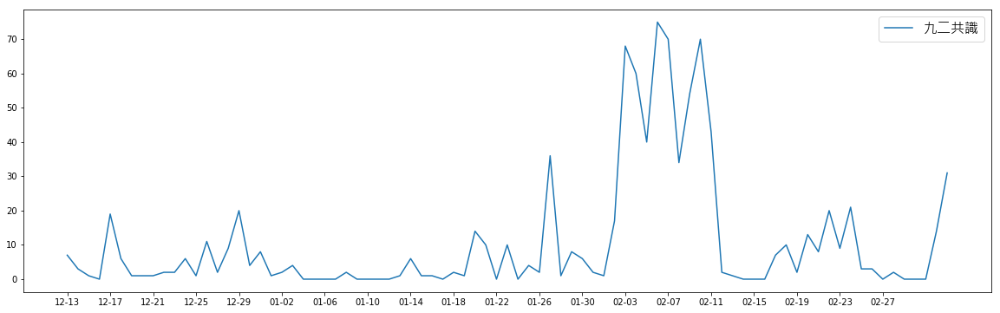

In [36]:
# word times
font = font_manager.FontProperties(fname='../msjh.ttc',
                               weight='bold',
                               style='normal', size=16)
plt.figure(figsize=(20,6))
plt.plot(aall_date, df.loc['九二共識']['2018-12-11':], label='九二共識')
plt.xticks(list(range(0, 80, 4)), [aall_date[80::-1][i] for i in range(0, 80, 4)])
plt.legend(prop=font)
plt.show()

# 修改 code     

plt.xticks(list(range(0, date_length, date_int)), [aall_date[from_index:to_index][i] for i in range(0, date_length, date_int)])

## 修改成

plt.xticks(list(range(0, date_length, date_int)), [aall_date[date_length::-1][i] for i in range(0, date_length, date_int)])

## 這樣圖中顯示的時間軸才會是正確的 

In [37]:
def plot_tfdf_of_word(word, df_tf, df_occur, date_from='2018-12-11', date_to='2019-03-03'):
    from_index = df_tf.columns.get_loc(date_from)
    to_index = df_tf.columns.get_loc(date_to)+1
    date_length = to_index-from_index
    date_int = date_length//25
    font = font_manager.FontProperties(fname='../msjh.ttc',
                                   weight='bold',
                                   style='normal', size=16)
    
    plt.plot(all_date[from_index:to_index], 
             df_tf.loc[word][date_from:date_to]*df_occur.loc[word][date_from:date_to], '-o', label=word)
    plt.legend(prop=font)
    plt.xticks(list(range(0, date_length, date_int)), [aall_date[date_length::-1][i] for i in range(0, date_length, date_int)])

In [38]:
df_tf.columns.get_loc('2019-03-03')

82

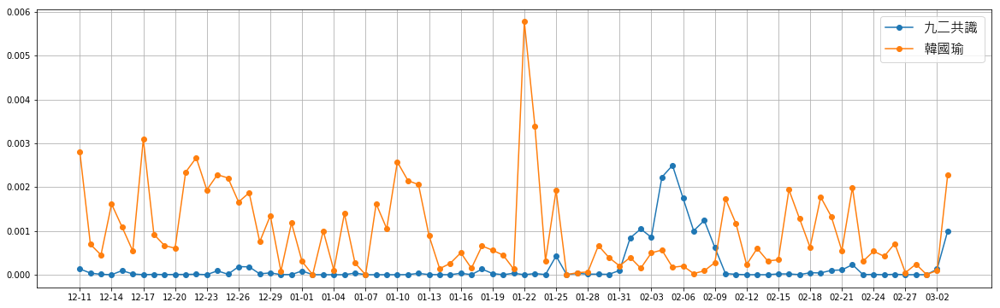

In [39]:
plt.figure(figsize=(20,6))

plot_tfdf_of_word('九二共識', df_tf, df_occur, date_from='2018-12-11', date_to='2019-03-03')
plot_tfdf_of_word('韓國瑜', df_tf, df_occur, date_from='2018-12-11', date_to='2019-03-03')

plt.grid()
plt.show()

In [40]:
def get_high_tfdf_date(word, df_tf, df_occur):
    tfdf = get_tfdf(word, df_tf, df_occur)
    m = statistics.mean(tfdf)
    s = statistics.stdev(tfdf)
    tfdf_bool = [x > m+s for x in tfdf]
    tfdf_date = {all_date[x[0]]: tfdf[x[0]] for x in list(filter(lambda e: e[1], enumerate(tfdf_bool)))}
    return tfdf_date

def draw_event(event, i, df_tf, df_occur):
    event_date = get_high_tfdf_date(event, df_tf, df_occur)
    date_index = [all_date.index(x) for x in event_date.keys()]
    plt.scatter(date_index, [i for x in date_index], s=[x*100000 for x in list(event_date.values())])

In [41]:
event_high_tfdf_dict = {e: get_high_tfdf_date(e, df_tf, df_occur) for e in events}
with open('../data/event_high_tfdf_dict_headnews.json', 'w', encoding='utf-8') as j:
     json.dump(event_high_tfdf_dict, j)

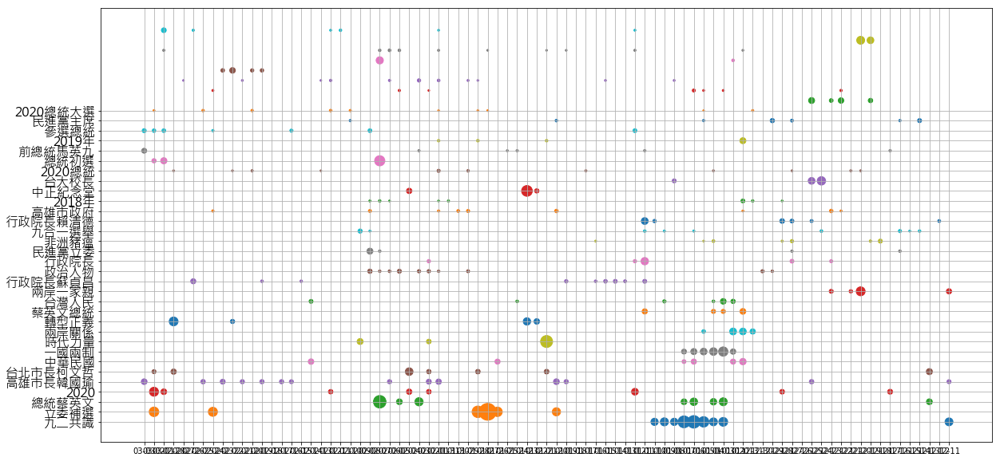

In [42]:
plt.figure(figsize=(20, 10))
for (i, e) in enumerate(events):
    draw_event(e, i, df_tf, df_occur)
plt.xticks(range(0, 83), aall_date)

plt.yticks(range(0, 32), events, fontproperties=font)

plt.grid()
plt.show()

In [43]:
# each event with tfdf of related people
event_people_dict = {}
for event in events:
    event_data = data_containing_keyword(event, data)
    # event_data[0]
    name_times_of_date = {}
    for date in all_date:
        oneday_data = list(filter(lambda data: data['date']==date, event_data))
        oneday_dict = [news['cutted_dict'] for news in oneday_data]
        current_word_dict = merge_one_day_news_dict(oneday_dict, 'wt', divide=len(oneday_data))
        possible_name = first_n_words(current_word_dict, 10000, 3, 3)
        name_times_of_date[date]= list(filter(lambda x: x[0] in names, possible_name))

    all_names = set([name for name_list in name_times_of_date.values() for (name, times) in name_list])
    event_people_dict[event] = {name: [dict(name_times_of_date[date]).get(name, 0) for date in all_date] for name in all_names}
    
with open('../data/event_people_dict_headnews.json', 'w', encoding='utf-8') as j:
     json.dump(event_people_dict, j)

In [44]:
pd.DataFrame(event_people_dict).head()

,九二共識,立委補選,總統蔡英文,2020,高雄市長韓國瑜,台北市長柯文哲,中華民國,一國兩制,時代力量,兩岸關係,...,民進黨主席,2020總統大選,就職典禮,2020年,總統大選,兩岸和平,國民黨主席吳敦義,2016年,雙城論壇,新北市長朱立倫
12月,"[0.08333333333333333, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0.11764705882352941, 0, 0, 0, 0.625, 0.5, ...","[0, 0.07692307692307693, 0, 0.2222222222222222...","[0, 0, 0, 0.2857142857142857, 0, 1.33333333333...","[0, 0, 0, 0.3333333333333333, 0, 0.33333333333...","[0, 0, 0, 0.2, 0, 0.16666666666666666, 0.2, 0....","[0.5, 0, 0, 0, 0, 0, 0.25, 0, 0, 0, 0, 0, 0, 0...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.2...","[0.5, 0, 0, 0, 0, 0, 3.0, 0, 0, 0, 0.25, 1.0, ...",...,"[0.3333333333333333, 0, 0.25, 0.18181818181818...","[0, 0, 0, 0.6666666666666666, 0, 0, 0.25, 0, 0...","[1.0, 0, 0, 0, 0, 0, 2.0, 0.16666666666666666,...","[0, 0.25, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0.3333333333333333, 1.0, 0,...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0.66666666666666...","[0, 0.25, 0, 0, 0, 4.0, 0.5, 0, 0, 0, 0, 0.333...","[0, 0, 0, 0, 0, 0.6666666666666666, 0, 0, 0.06...","[0, 0, 0, 0, 0, 0, 0.6666666666666666, 1.0, 0,..."
交通部,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0.1764705882352941, 0, 0, 0, 1.0, 0, 0, 0,...","[1.0, 0.23076923076923078, 0, 0, 0, 0, 0, 0.13...","[2.0, 0.09090909090909091, 0, 0, 0, 0.66666666...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0.3571428571428571...","[0.3333333333333333, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0.6666666666666666...",NaN,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1.3333333333333333, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",NaN,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",NaN,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.3333333333..."
何志偉,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.5, 0.47058823529411764, 1.0, 1.5, 2.8000000...","[0, 0, 0.0625, 0, 0, 0, 0.2, 0, 0, 0, 0, 0, 0,...","[0, 0, 0.8333333333333333, 0.2857142857142857,...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.25, 0, 0, 0, ...","[0, 0.7272727272727273, 0.2777777777777778, 0....","[0, 0, 0, 0, 0, 0, 0.75, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 2.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0...",...,"[0, 0, 0, 0.18181818181818182, 0, 0.25, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0...","[0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",NaN,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",NaN,"[0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0..."
促轉會,"[0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0.08333333333333...","[0, 0, 0, 0, 0, 0, 0, 0.14285714285714285, 0, ...","[0, 0, 0, 0, 0, 0, 0, 1.1333333333333333, 0, 0...","[0, 0, 0, 0, 0, 0, 0, 3.5, 0, 0, 3.0, 0, 0.25,...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.0...","[0, 0, 0, 0, 0, 0, 0, 0.125, 0, 0, 0, 0, 0, 0,...","[0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 6.5, 0, 0, 0, 0, 0, 0, 0...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0.125, 0, 0, 0, 0,...",...,"[0, 0, 0, 0, 0, 0, 0, 0.2, 0, 0, 0, 0, 0.5, 0,...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0...",NaN,"[0, 0, 0, 0, 0, 0, 0, 0.5, 1.3333333333333333,...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.0, 0, 0...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3.6666666666...","[0, 0, 0, 0, 0, 0, 0, 0, 0.26666666666666666, ...","[0, 0, 0, 0, 0, 0, 0,

In [45]:
people_tfdf_dict = {name: list(get_tfdf(name, df_tf, df_occur)) for name in names}
with open('../data/people_tfdf_dict_headnews.json', 'w', encoding='utf-8') as j:
     json.dump(people_tfdf_dict, j)

In [46]:
pd.DataFrame(people_tfdf_dict, index=aall_date).head(5)

,民進黨,柯文哲,韓國瑜,國民黨,蔡英文,蘇貞昌,行政院,賴清德,王金平,吳敦義,...,鄭文燦,外交部,新北市,促轉會,教育部,鄭麗君,交通部,陳水扁,12月,基金會
03-03,0.000142,0.000378,0.002807,0.001985,0.000340,0.000057,0.000142,0.000000,0.000454,0.000009,...,0.000000,2.268002e-04,0.000113,0.000000,0.000151,0.000000e+00,0.000000,0.000000e+00,0.000028,0.000000
03-02,0.001123,0.001487,0.000694,0.001450,0.000743,0.000000,0.000000,0.000000,0.001636,0.000186,...,0.000050,4.130166e-05,0.000012,0.000000,0.000008,0.000000e+00,0.000008,6.608266e-05,0.000000,0.000000
03-01,0.000282,0.000122,0.000451,0.001728,0.000329,0.000056,0.000056,0.000000,0.000732,0.001070,...,0.000028,9.388613e-06,0.000000,0.000028,0.000000,0.000000e+00,0.000009,1.464624e-03,0.000000,0.000038
02-28,0.000095,0.004615,0.001615,0.000435,0.000911,0.000009,0.000006,0.000000,0.000151,0.000352,...,0.000000,1.242457e-04,0.000012,0.000639,0.000000,0.000000e+00,0.000000,2.958230e-06,0.000012,0.000118
02-27,0.000999,0.001347,0.001085,0.001857,0.000523,0.000111,0.000071,0.000038,0.000006,0.000090,...,0.000000,9.906571e-07,0.000118,0.000074,0.000000,9.906571e-07,0.000065,9.906571e-07,0.000004,0.000160


In [47]:
test = json.loads(open('../data/people_tfdf_dict.json').read())
print(test)

{'柯文哲': [0.0001774622892635315, 0.00021972078558631645, 0.0005456588027603917, 0.0, 0.00028557394651771133, 6.069213308570942e-06, 0.00023407196040839986, 0.0007321122746466906, 0.00022065313327449248, 0.00010860711376595167, 0.0014189810737282994, 0.005777550855883697, 0.00016845597144023375, 2.2260250149561056e-05, 0.00016105091087711008, 0.0013647876049289831, 0.003634561374525031, 0.0014463653689082495, 0.0012216491907909733, 0.0005150290378276566, 0.00011431510959961132, 0.0020979020979020975, 0.00019305592681695326, 0.000952567730367299, 0.00022011886418666079, 0.0013165318788790673, 0.00034565565419880656, 0.00022417943321834796, 0.0004042854255104103, 0.0002446662752006263, 0.0008024072216649949, 0.001790830945558739, 0.00010318320177475106, 0.00018974260512079151, 0.00039742419443978714, 0.00040470010326830214, 0.0005693158832433591, 0.0006240898689411276, 0.00029416090601559053, 0.0003247825916530874, 0.000656526972316446, 7.095061206728011e-05, 0.0009368216611447503, 0.00067

# visualization

In [48]:
# import packages
import math
import numpy as np
import plotly.plotly as py
import plotly.graph_objs as go
import ipywidgets as widgets
from IPython.display import clear_output
from datetime import datetime, timedelta
import json
import plotly
plotly.tools.set_credentials_file(username='jeff20628m', api_key='ledmpdJLKh2TTY5fU60O')

### Section I 政治事件新聞列表分析¶


In [49]:
def get_scatter_trace(points_x, points_y, points_size=10, trace_name='', line=False):
    if line:
        return go.Scatter(
            x = points_x,
            y = points_y,
            mode = 'lines',
            hoverinfo = 'x+y',
            name
            = trace_name,
            text = points_size,
            yaxis = 'y2',
            line = {
                "color": 'rgba(255, 166, 87, 0.4)'
            }
        )
    else:
        return go.Scatter(
            x = points_x,
            y = points_y,
            mode = 'markers' if not line else 'lines',
            marker = {
                'size': points_size
            },
            hoverinfo = 'text+name',
            name = trace_name,
            text = points_size
        )

In [50]:
events = json.loads(open('../data/event_high_tfdf_dict_headnews.json').read())

In [51]:
events

{'九二共識': {'2019-02-01': 0.0008394895903290799,
  '2019-02-02': 0.0010440554095120902,
  '2019-02-03': 0.0008529780156139872,
  '2019-02-04': 0.002227634549126766,
  '2019-02-05': 0.0024946219837752386,
  '2019-02-06': 0.00174529028283969,
  '2019-02-07': 0.0010022643750696014,
  '2019-02-08': 0.0012379067249914427,
  '2019-03-03': 0.0009968646997347054},
 '立委補選': {'2018-12-12': 0.0014496883789510198,
  '2018-12-18': 0.0013148938803291877,
  '2019-01-14': 0.0021171152050258922,
  '2019-01-15': 0.004491955512363678,
  '2019-01-16': 0.001429598541976692,
  '2019-01-22': 0.0010758665208269826},
 '總統蔡英文': {'2019-01-04': 0.0024860161591050336,
  '2019-01-06': 0.0005334755934915978,
  '2019-01-08': 0.001078167115902965,
  '2019-02-04': 0.0005445328897865432,
  '2019-02-05': 0.0009071352668273596,
  '2019-02-07': 0.0006805498843065193,
  '2019-02-08': 0.0010168519526715424,
  '2019-03-01': 0.0005472777346232611},
 '2020': {'2018-12-12': 0.0012886118924009065,
  '2018-12-13': 0.0005257623554153

In [52]:
def sectionI_plot(ori_data, title=''):
    
    # data
    fig_data = []
    for index, name in enumerate(ori_data):
        x, y, size = [], [], []
        for date, tfdf_val in ori_data[name].items():
            x.append(datetime.strptime(date, "%Y-%m-%d"))
            y.append(len(ori_data) - index)
            size.append(max(math.log(round(tfdf_val*10000, 2))*10, 0)) # constants need change
        fig_data.append(get_scatter_trace(x, y, points_size=size, trace_name=name))
        
    # layout
    fig_layout = go.Layout(
        title=title,
        xaxis=dict(
            title='Date'
        ),
        yaxis=dict(
            title='Event'
        )
    )

    fig = go.Figure(data=fig_data, layout=fig_layout)
    display(py.iplot(fig, filename='bubble-event'))

In [53]:
sectionI_plot(events)

High five! You successfully sent some data to your account on plotly. View your plot in your browser at https://plot.ly/~jeff20628m/0 or inside your plot.ly account where it is named 'bubble-event'


C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\display.py:689: UserWarning:

Consider using IPython.display.IFrame instead



###  Section II 政治事件和政治人相關列表分析

In [54]:
event_people_relation = json.loads(open('../data/event_people_dict_headnews.json').read())

In [55]:
pd.DataFrame(event_people_relation).T.head()

,12月,交通部,何志偉,促轉會,候選人,卓榮泰,台北市,吳敦義,國民黨,基金會,...,鄭文燦,鄭麗君,陳其邁,陳思宇,陳水扁,韓國瑜,馬英九,高雄市,黃國昌,黨主席
九二共識,"[0.08333333333333333, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0.08333333333333...","[0, 0.1, 0, 0, 0, 0, 0, 0, 1.0, 0.083333333333...","[0, 0, 0, 0, 0, 0, 0, 0, 16.0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0.75, 0.1428571428...","[0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0...","[0, 0.30000000000000004, 0, 0, 0, 0, 0, 0.5, 0...","[0, 0.2, 0, 0, 0, 0, 0, 0, 0, 0.25, 0, 0, 0, 0...",...,"[0, 0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.33...","[0, 0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[0, 0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.75, 0.1, 0, 0, 0, 0, 0, 1.0, 0, 0.166666666...","[0, 0, 0, 0, 0, 0, 0, 3.5, 0, 1.08333333333333...","[0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0.6000000000000001, 0, 0, 0, 0, 0, 0, 1.0,..."
立委補選,"[0, 0.11764705882352941, 0, 0, 0, 0.625, 0.5, ...","[0, 0.1764705882352941, 0, 0, 0, 1.0, 0, 0, 0,...","[0.5, 0.47058823529411764, 1.0, 1.5, 2.8000000...","[0, 0, 0, 0, 0, 0, 0, 0.14285714285714285, 0, ...","[0.16666666666666666, 0.058823529411764705, 0....","[0, 0, 0, 0.4, 0, 0, 3.75, 0.14285714285714285...","[0.6666666666666666, 0.5882352941176471, 0.4, ...","[0, 0.17647058823529413, 0, 0, 0, 0, 0, 0, 0, ...","[2.8333333333333335, 1.3529411764705883, 0, 1....","[0, 0, 0, 0, 0, 0, 0, 0.2857142857142857, 0, 0...",...,"[0.16666666666666666, 0.29411764705882354, 0.6...","[0, 0.058823529411764705, 0, 0, 0, 0, 0.25, 0....","[0, 0.058823529411764705, 0, 0.1, 0, 0, 0, 0, ...","[3.5, 0.5882352941176471, 2.6, 2.4, 5.4, 5.0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0.30000000000000004, 0, 0, 0, 0.4285...","[0, 0, 0, 0, 0, 0.125, 2.0, 1.4285714285714286...","[0, 0.11764705882352941, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0.2, 0.8, 0, 0, 0, 0.14285714285714285,...","[0.16666666666666666, 0.35294117647058826, 0.2..."
總統蔡英文,"[0, 0.07692307692307693, 0, 0.2222222222222222...","[1.0, 0.23076923076923078, 0, 0, 0, 0, 0, 0.13...","[0, 0, 0.0625, 0, 0, 0, 0.2, 0, 0, 0, 0, 0, 0,...","[0, 0, 0, 0, 0, 0, 0, 1.1333333333333333, 0, 0...","[0, 0.07692307692307693, 0, 0.1111111111111111...","[0, 0, 0, 2.3333333333333335, 0, 1.66666666666...","[0, 0.15384615384615385, 0.4375, 0, 0, 0, 0, 0...","[0, 0.07692307692307693, 0, 0.5555555555555556...","[0, 0.6153846153846154, 0.125, 1.1111111111111...","[0, 0.07692307692307693, 0, 0.1111111111111111...",...,"[0, 0.07692307692307693, 0.125, 1.666666666666...","[0, 0, 0, 0.1111111111111111, 0, 0, 1.0, 0, 0,...","[0.25, 0, 0, 0.4444444444444444, 0, 0.33333333...","[0, 0, 0.25, 0.1111111111111111, 0.33333333333...","[0, 0.07692307692307693, 0, 0.2222222222222222...","[1.5, 0.38461538461538464, 0, 0, 0, 0.33333333...","[0.25, 0, 0, 0.5555555555555556, 0, 0.16666666...","[0, 0, 0, 0, 0, 0, 0, 0.06666666666666667, 0, ...","[0, 0, 0.0625, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[0.25, 0.38461538461538464, 0, 1.3333333333333..."
2020,"[0, 0, 0, 0.2857142857142857, 0, 1.33333333333...","[2.0, 0.09090909090909091, 0, 0, 0, 0.66666666...","[0, 0, 0.8333333333333333, 0.2857142857142857,...","[0, 0, 0, 0, 0, 0, 0, 3.5, 0, 0, 3.0, 0, 0.25,...","[0, 0.09090909090909091, 0.3333333333333333, 0...","[0, 0, 0, 0.14285714285714285, 0, 0.6666666666...","[0.5, 0.09090909090909091, 0.8333333333333333,...","[0, 0.36363636363636365, 1.0, 0.71428571428571...","[3.5, 1.8181818181818181, 1.0, 2.1428571428571...","[0, 0.2727272727272727, 0, 0.14285714285714285...",...,"[0, 0.09090909090909091, 0.5, 0.28571428571428...","[0, 0, 0, 0, 0, 0, 0, 0.25, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0.14285714285714285, 0, 0.3333333333...","[0.5, 0, 0.6666666666666666, 1.428571428571428...","[0, 0, 0.16666666666666666, 0

In [56]:
def sectionII_plot(event_name, ori_data, selector_widget, start_date='2018-12-11', title=''):
    start_date = datetime.strptime(start_date, "%Y-%m-%d")
    
    # data
    fig_data = []
    x, y, size = [], [], []
    for date, tfdf_val in events[event_name].items():
        x.append(datetime.strptime(date, "%Y-%m-%d"))
        y.append(len(ori_data) + 1)
        size.append(max(math.log(round(tfdf_val*10000, 2))*10, 0)) # constants need change
    fig_data.append(get_scatter_trace(x, y, points_size=size, trace_name=event_name))
        
    for index, name in enumerate(ori_data):
        x, y, size = [], [], []
        for day_index, tfdf_val in enumerate(ori_data[name]):
            if tfdf_val != 0:
                x.append(start_date + timedelta(days=day_index))
                y.append(len(ori_data) - index)
                size.append(max(math.log(round(tfdf_val, 2))*10,0)) ## constants need change
        fig_data.append(get_scatter_trace(x, y, points_size=size, trace_name=name))
        
    # layout
    fig_layout = go.Layout(
        title=title,
        xaxis=dict(
            title='Date'
        ),
        yaxis=dict(
            title='People'
        )
    )

    fig = go.Figure(data=fig_data, layout=fig_layout)

    clear_output()
    display(selector_widget)
    display(py.iplot(fig, filename='event-people'))

In [57]:
event_selector = widgets.Dropdown(
    options=list(events.keys()),
    description='政治事件：'
)
display(event_selector)

def event_change(change):
    top_10_related_people = dict(sorted(event_people_relation[change['new']].items(), key=lambda x: sum(x[1]), reverse=True)[:10])
    sectionII_plot(change['new'], top_10_related_people, event_selector, title=change['new'])

event_change({'new': list(events.keys())[0]})
    
event_selector.observe(event_change, names='value')

Dropdown(description='政治事件：', options=('九二共識', '立委補選', '總統蔡英文', '2020', '高雄市長韓國瑜', '台北市長柯文哲', '中華民國', '一國兩制', …

### Section III 政治人物列表、政治事件列表以及兩者相關列表之疊圖分析¶


In [58]:
people = json.loads(open('../data/people_tfdf_dict_headnews.json').read())

In [59]:
pd.DataFrame(people,index = aall_date).T.head()

,03-03,03-02,03-01,02-28,02-27,02-26,02-25,02-24,02-23,02-22,...,12-20,12-19,12-18,12-17,12-16,12-15,12-14,12-13,12-12,12-11
民進黨,0.000142,0.001123,0.000282,0.000095,0.000999,0.001677,0.000461,0.000920,0.001300,0.001287,...,0.000283,0.000442,0.001428,0.002820,0.001674,0.003469,0.010278,0.001922,0.005374,0.000804
柯文哲,0.000378,0.001487,0.000122,0.004615,0.001347,0.000863,0.000918,0.000000,0.000816,0.002216,...,0.002386,0.000571,0.000971,0.000419,0.000627,0.002397,0.000655,0.002924,0.000318,0.000174
韓國瑜,0.002807,0.000694,0.000451,0.001615,0.001085,0.000542,0.003094,0.000920,0.000666,0.000604,...,0.001992,0.000307,0.000536,0.000419,0.000710,0.000047,0.000241,0.000004,0.000095,0.002278
國民黨,0.001985,0.001450,0.001728,0.000435,0.001857,0.001455,0.000539,0.001238,0.002473,0.001963,...,0.000434,0.000072,0.000703,0.001395,0.000664,0.000252,0.000796,0.000772,0.001234,0.000469
蔡英文,0.000340,0.000743,0.000329,0.000911,0.000523,0.000044,0.000519,0.000851,0.000340,0.000138,...,0.000172,0.000256,0.001595,0.000691,0.000207,0.000378,0.000627,0.000874,0.000769,0.000067


In [60]:
def sectionIII_plot(people_data, events_data, selector_widget, start_date='2018-12-11', title=''):
    start_date = datetime.strptime(start_date, "%Y-%m-%d")
    
    fig_data = []
    
    # people data
    x, y = [], []
    for day_index, value in enumerate(people_data['tfdf']):
        x.append(start_date + timedelta(days=day_index))
        y.append(value)
    fig_data.append(get_scatter_trace(x, y, line=True))
    
    # event data
    for index, name in enumerate(events_data):
        x, y, size = [], [], []
        for date, tfdf_val in events_data[name].items():
            x.append(datetime.strptime(date, "%Y-%m-%d"))
            y.append(len(events_data) - index)
            size.append(max(math.log(round(tfdf_val*10000, 2))*10, 0)) # constants need change
        fig_data.append(get_scatter_trace(x, y, size, trace_name=name))
        
    # layout
    fig_layout = go.Layout(
        title=title,
        xaxis=dict(
            title='Date'
        ),
        yaxis=dict(
            title='Event'
        ),
        yaxis2=dict(
            title='People Reputation',
            titlefont=dict(
                color='rgb(148, 103, 189)'
            ),
            tickfont=dict(
                color='rgb(148, 103, 189)'
            ),
            overlaying='y',
            side='right'
        )
    )

    fig = go.Figure(data=fig_data, layout=fig_layout)
    
    clear_output()
    display(selector_widget)
    display(py.iplot(fig, filename='person-events'))

In [61]:
people_selector = widgets.Dropdown(
    options=list(people.keys()),
    description='政治人物：'
)
display(people_selector)

def people_change(change):
    sectionIII_plot({
        'name': change['new'],
        'tfdf': people[change['new']]
    }, events, people_selector, title='人物與事件聲量圖({})'.format(change['new']))

people_change({'new': list(people.keys())[0]})
    
people_selector.observe(people_change, names='value')

Dropdown(description='政治人物：', index=2, options=('民進黨', '柯文哲', '韓國瑜', '國民黨', '蔡英文', '蘇貞昌', '行政院', '賴清德', '王金平',…